# Notebook for optimising smFISH analysis parameters
# (For monolayer tissue culture cells)
## Using Big-fish v0.6.2
## Revised: 2023.03.22
1. Optimise Bigfish parameters for a single image
2. The set parameters should then be used for batch processing

In [1]:
import os
import time

from skimage.morphology import white_tophat, black_tophat, disk
from scipy import ndimage, misc
import numpy as np
import tifffile
import matplotlib.pyplot as plt
import pathlib
from PIL import Image
import pandas as pd

from cellpose import models, io
from cellpose import plot as cplot

import bigfish
import bigfish.stack as stack
import bigfish.multistack as multistack 
import bigfish.segmentation as segmentation
import bigfish.plot as plot
import bigfish.detection as detection

print("Big-FISH version: {0}".format(bigfish.__version__))

2023-03-22 22:43:02,696 [INFO] WRITING LOG OUTPUT TO /Users/jefflee/.cellpose/run.log
Big-FISH version: 0.6.2


/opt/miniconda3/envs/bigfish_v6/lib/python3.7/site-packages/bigfish/segmentation/nuc_segmentation.py:16: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology.selem import disk


# 0. Load Bigfish helper functions

In [2]:
## Calculate PSF (thanks MK!!)
def calculate_psf(voxel_size_z, voxel_size_yx, Ex, Em, NA, RI, microscope):
    if microscope == 'widefield':
        psf_yx = 0.225*Em/NA
        psf_z = 0.78*RI*Em/(NA**2)
    elif microscope in {'confocal', 'nipkow'}:
        psf_yx = 0.225/NA*Ex*Em/np.sqrt(Ex**2 + Em**2)
        psf_z = 0.78*RI/NA**2*Ex*Em/np.sqrt(Ex**2 + Em**2)
    else:
        print(f'microscope={microscope} is not a valid option')
        sys.exit()
    return psf_z, psf_yx

## Subtract background
def subtract_background(image, radius=5, light_bg=False):
    str_el = disk(radius) #you can also use 'ball' here to get a slightly smoother result at the cost of increased computing time
    if light_bg:
        return black_tophat(image, str_el)
    else:
        return white_tophat(image, str_el)

# 1. Import image and its metadata

In [3]:
# Import image file
file_name = '/Users/jefflee/Desktop/FISH-01_4h_17_bsub50.tif'
img = tifffile.imread(file_name)

print("Image imported: ", file_name)
print("\r shape: {0}".format(img.shape))
print("\r dtype: {0}".format(img.dtype))

# Set up image acquisition parameters
chan = 3
voxel_size_z = 200
voxel_size_yx = 65
Ex = 570
Em = 610
NA = 1.45
RI = 1.45
microscope = 'confocal'

psf_z = calculate_psf(voxel_size_z, voxel_size_yx, Ex, Em, NA, RI, microscope)[0]
psf_yx = calculate_psf(voxel_size_z, voxel_size_yx, Ex, Em, NA, RI, microscope)[1]

spot_radius_px = detection.get_object_radius_pixel(
    voxel_size_nm=(voxel_size_z, voxel_size_yx, voxel_size_yx), 
    object_radius_nm=(psf_z, psf_yx, psf_yx), 
    ndim = 3)

print(" ")
print("PSF and Sigma calculation finished")
print("\r theoretical psf_z = ", psf_z)
print("\r theoretical psf_yx = ", psf_yx)
print("\r spot radius (sigma_z) (z axis): {:0.3f} pixels".format(spot_radius_px[0]))
print("\r spot radius (sigma_yx) (yx plan): {:0.3f} pixels".format(spot_radius_px[-1]))

Image imported:  /Users/jefflee/Desktop/FISH-01_4h_17_bsub50.tif
 shape: (33, 4, 2048, 2048)
 dtype: uint16
 
PSF and Sigma calculation finished
 theoretical psf_z =  224.03449989716577
 theoretical psf_yx =  64.62533650879783
 spot radius (sigma_z) (z axis): 1.120 pixels
 spot radius (sigma_yx) (yx plan): 0.994 pixels


## 1-2 Optimise Cellpose segmentation parameters

In [4]:
# cellpose parameters 
seg_chan = 1
med_filter_radius = 10
diameter = 600
flow_threshold = 0
cellprob_threshold = -6
do_3D = False
gpu = False
clip_intensity = False
clip_value = 10

Processing:  /Users/jefflee/Desktop/FISH-01_4h_17_bsub50.tif
2023-03-22 22:43:09,190 [INFO] >>>> using CPU
2023-03-22 22:43:09,307 [WARNING] cellprob_threshold and dist_threshold are being deprecated in a future release, use mask_threshold instead
2023-03-22 22:43:09,307 [INFO] ~~~ FINDING MASKS ~~~
2023-03-22 22:43:12,989 [INFO] >>>> TOTAL TIME 3.68 sec
Cellpose done: 8.7 sec


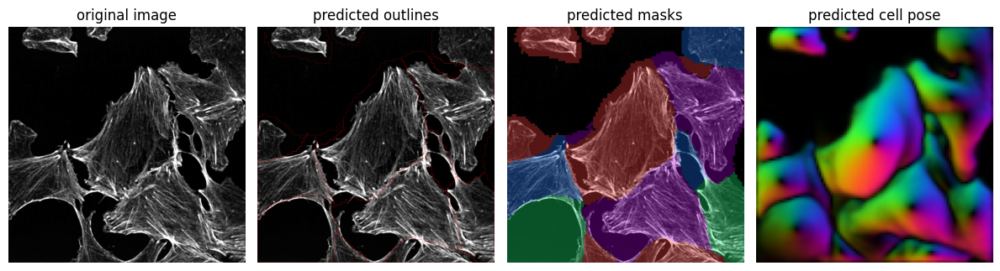

Plotting done: 0.1 sec


In [5]:
# run cellpose
print("Processing: ", file_name)
t1 = time.time()

seg_img = np.max(img, 0)[seg_chan] # max project on the first np axis (i.e. max-z projection)

if clip_intensity == True:
    seg_img = np.clip(seg_img, 0, clip_value) # clip intensity if using smFISH background

seg_img = ndimage.median_filter(seg_img, size = med_filter_radius) # median filter

model = models.Cellpose(gpu=gpu, model_type='cyto')
masks, flows, styles, diams = model.eval(
    seg_img, 
    channels = [0,0], 
    diameter = diameter,
    do_3D = do_3D, 
    flow_threshold = flow_threshold,
    cellprob_threshold = cellprob_threshold,
    resample = False   
)

t2 = time.time()
time_elapsed = (t2 - t1)
print('Cellpose done: %s sec' % round(time_elapsed,1))

# Inspect cellpose output
fig = plt.figure(figsize=(12,5))
cplot.show_segmentation(fig, seg_img, masks, flows[0], channels=[0,0])
plt.tight_layout()
plt.show()

t3 = time.time()
time_elapsed = (t3 - t2) / 60
print('Plotting done: %s sec' % round(time_elapsed,1))


# 2. Optimise bigfish parameters
## 2-1. Get LoG filtred RNA channel image for pre-detection thresholding

In [6]:
# Background subtract RNA image and LoG filter
start_time = time.time()

# Channel subset original image
rna = np.swapaxes(img,0,1)[chan]

print("Image shape ")
print("\r shape: {0}".format(rna.shape))
print("\r dtype: {0}".format(rna.dtype))

# MIP image for plotting later or for 2D detection
rna_mip = stack.maximum_projection(rna)

# Background subtract
rna_no_bg = []
for z in rna:
    z_no_bg = subtract_background(z)
    rna_no_bg.append(z_no_bg)
rna = np.array(rna_no_bg)

print ("Background subtraction finished ", time.time() - start_time, "sec")

# LoG filter
rna_log = stack.log_filter(rna, sigma = spot_radius_px)
print ("LoG filter finished ", time.time() - start_time, "sec")

# Export LoG filtered image to the working directory
rna_log_max = np.max(rna_log, 0)
Image.fromarray(rna_log_max).save('rna_log.tif')

print ("Image saved to working dir! Open it on ImageJ! ", time.time() - start_time, "sec")


Image shape 
 shape: (33, 2048, 2048)
 dtype: uint16
Background subtraction finished  14.794703006744385 sec
LoG filter finished  53.67636799812317 sec
Image saved to working dir! Open it on ImageJ!  53.85468912124634 sec


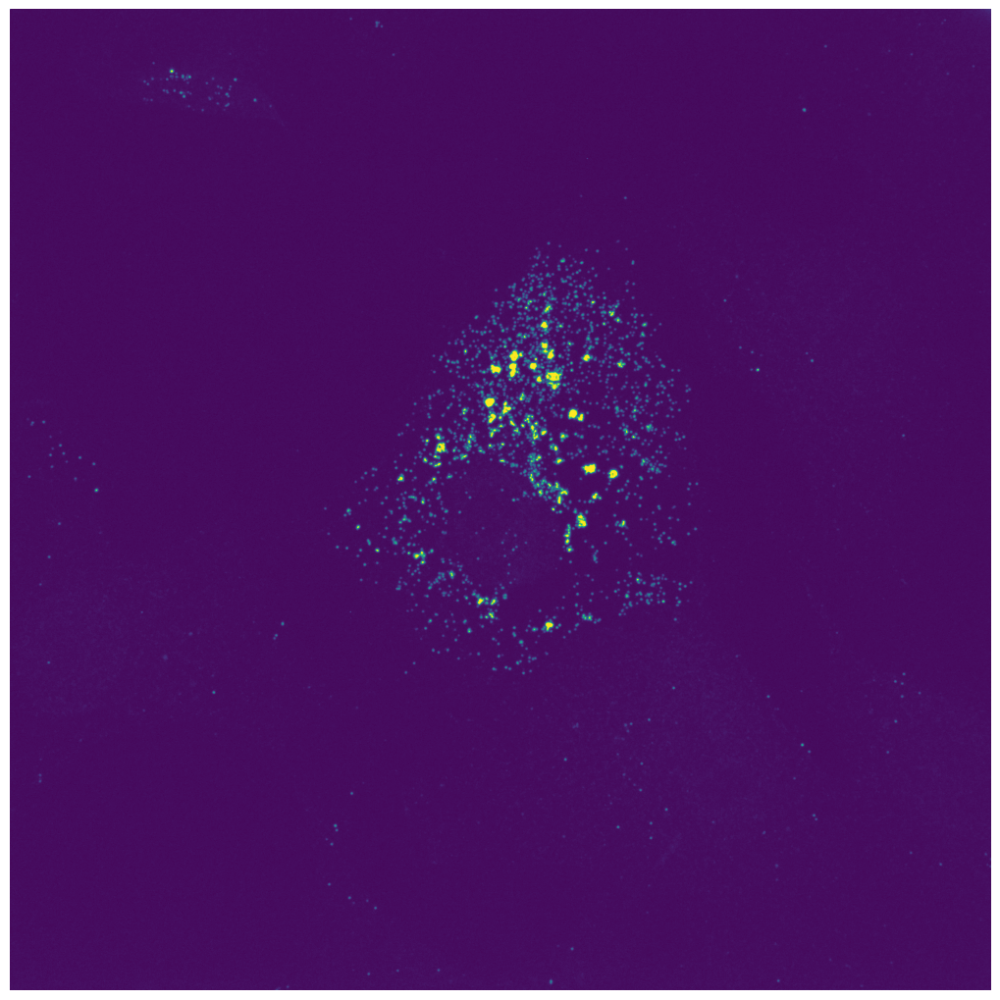

In [7]:
plot.plot_images(rna_mip, contrast=True)

## 2-2 Optimise single-spot detection

### Option 1 - Manual thresholding

pre-detection done
threshold done 8.87841510772705 sec
detected spots
 shape: (2398, 3)
 dtype: int64
 threshold: 8


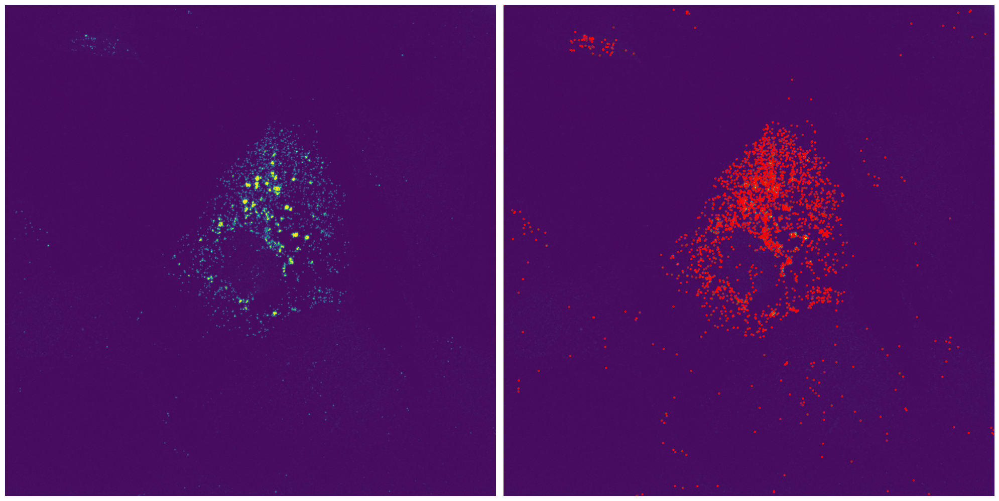

Plotting done  15.383380889892578 sec


In [8]:
start_time = time.time()

## local maximum detection
mask = detection.local_maximum_detection(rna_log, min_distance = spot_radius_px)
print ('pre-detection done')

## thresholding
threshold = 8
spots, _ = detection.spots_thresholding(rna_log, mask, threshold)
print ('threshold done', time.time() - start_time, "sec")

print("detected spots")
print("\r shape: {0}".format(spots.shape))
print("\r dtype: {0}".format(spots.dtype))
print("\r threshold: {0}".format(threshold))

## Plot detected spots
plot.plot_detection(rna_mip, spots, radius = 3, framesize = (20, 16), contrast = True)
print ("Plotting done ", time.time() - start_time, "sec")


In [9]:
# z, y, x
print(spots.shape)
print(spots)

(2398, 3)
[[   2    0    0]
 [   2 1258  710]
 [   4  759  965]
 ...
 [  30 1190 1053]
 [  31  141  347]
 [  32    0    0]]


### Option 2 - Auto-thresholding

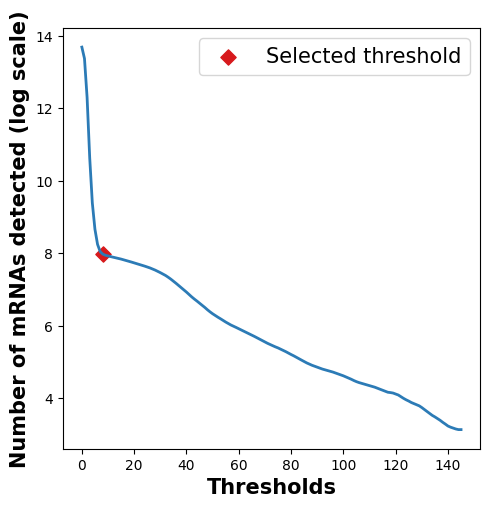

Elbow plot done  73.58470296859741 sec
Auto-threshold value found 76.22492980957031 sec
 threshold: 8.0
threshold done 77.72294282913208 sec
detected spots
 shape: (2398, 3)
 dtype: int64
 threshold: 8.0


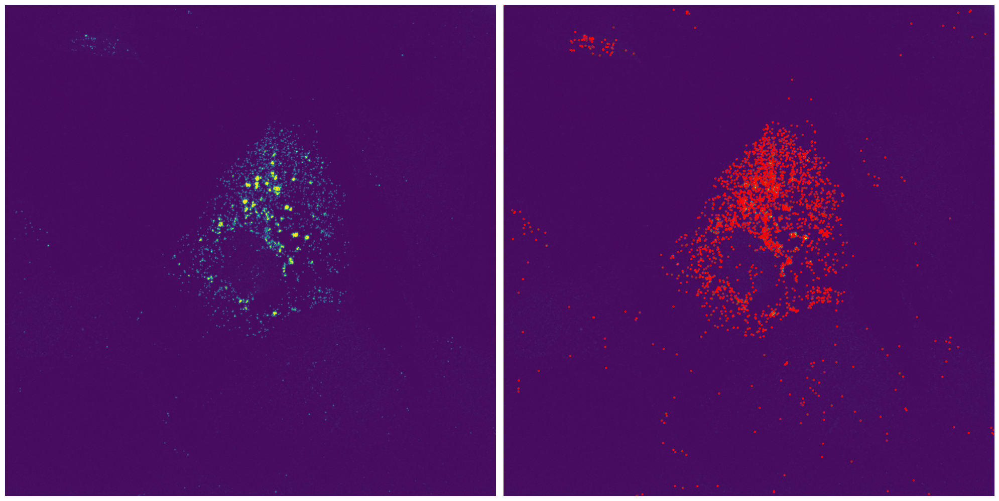

Plotting done  84.19458889961243 sec


In [15]:
start_time = time.time()

## local maximum detection
mask = detection.local_maximum_detection(rna_log, min_distance = spot_radius_px)
print ('pre-detection done')

## Get Elbow plot
plot.plot_elbow(
    rna,
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    spot_radius = (psf_z, psf_yx, psf_yx)
)
print ("Elbow plot done ", time.time() - start_time, "sec")

## Get autothreshold value
threshold_auto = detection.automated_threshold_setting(rna_log, mask)
print("Auto-threshold value found", time.time() - start_time, "sec")
print("\r threshold: {0}".format(threshold_auto))

## thresholding (automated)
spots, _ = detection.spots_thresholding(rna_log, mask, threshold_auto)
print ('threshold done', time.time() - start_time, "sec")

print("detected spots")
print("\r shape: {0}".format(spots.shape))
print("\r dtype: {0}".format(spots.dtype))
print("\r threshold: {0}".format(threshold_auto))

## Plot detected spots
plot.plot_detection(rna_mip, spots, radius = 3, framesize = (20, 16), contrast = True)
print ("Plotting done ", time.time() - start_time, "sec")

## 2-3. Quantify dense regions

### 2-3-1. Get a reference spot

Denoising done  21.70816397666931 sec
Denoised reference spot for decompose cluster 21.765557050704956 sec
 shape: (5, 5, 5)
 dtype: uint16


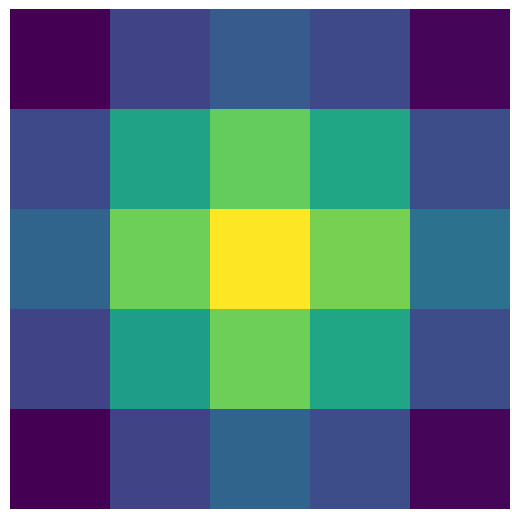

In [10]:
start_time = time.time() 

## gaussian kernel
kernel_size = detection.get_object_radius_pixel(
    voxel_size_nm = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    object_radius_nm = (psf_z, psf_yx, psf_yx),
    ndim = 3
)
large_kernel_size = tuple([kernel_size_ * 5 for kernel_size_ in kernel_size])

# denoising
rna_denoised = stack.remove_background_gaussian(rna, sigma = large_kernel_size)
print("Denoising done ", time.time() - start_time, "sec")

# reference spot from denoised 
reference_spot = detection.build_reference_spot(
    image = rna_denoised,
    spots = spots,
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    spot_radius = (psf_z, psf_yx, psf_yx),
    alpha = 0.5
)

print("Denoised reference spot for decompose cluster", time.time() - start_time, "sec")
print("\r shape: {0}".format(reference_spot.shape))
print("\r dtype: {0}".format(reference_spot.dtype))

plot.plot_reference_spot(reference_spot, rescale = True)


### 2-3-2. Decompose dense regions with the reference spot

fitted gaussian to ref spot 0.04952812194824219 sec
detected potential dense regions 1.712421178817749 sec
 my cluster region counts are:  859
pre-computed gaussian 1.7297170162200928 sec
gaussian mixture simulation done 1.949218988418579 sec 

detected spots before decomposition
 shape: (2398, 3)
 dtype: int64 

detected spots after decomposition
 shape: (3982, 3)
 dtype: int64


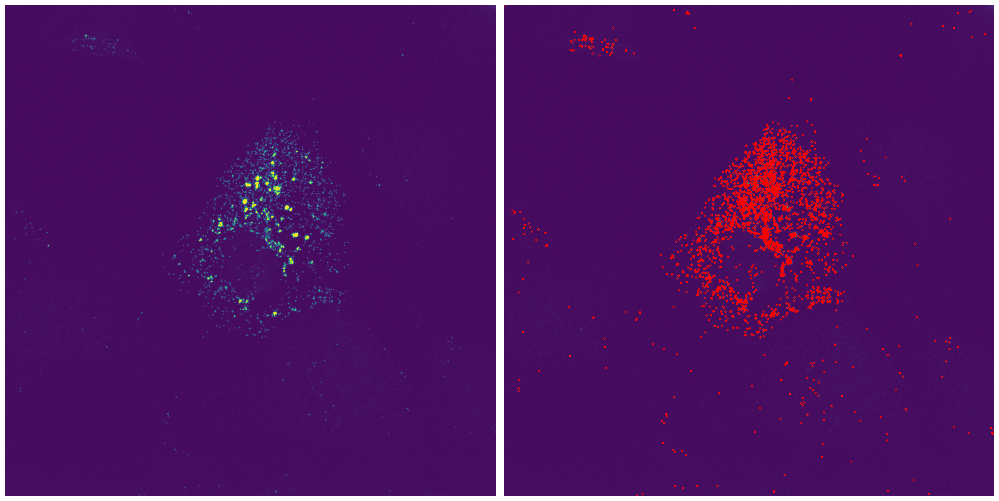

Plotting done  11.755945920944214 sec


In [11]:
start_time = time.time() 

# fit a gaussian function on the reference spot
sigma_z, sigma_yx, amplitude, background = detection.modelize_spot(
    reference_spot = reference_spot, 
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    spot_radius = (psf_z, psf_yx, psf_yx)
)
    
print ('fitted gaussian to ref spot', time.time() - start_time, "sec")

# detect potential dense regions
regions_to_decompose, spots_out_regions, region_size = detection.get_dense_region(
    image = rna_denoised, 
    spots = spots,
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    spot_radius = (psf_z, psf_yx, psf_yx),
    beta = 1
)
    
print('detected potential dense regions', time.time() - start_time, "sec")
print("\r my cluster region counts are: ", len(regions_to_decompose))

# precompute gaussian function values
max_grid = max(200, region_size + 1)
precomputed_gaussian = detection.precompute_erf(
    ndim = 3,
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    sigma = (sigma_z, sigma_yx, sigma_yx),
    max_grid = max_grid
)

print ('pre-computed gaussian', time.time() - start_time, "sec")

# simulate gaussian mixtures
spots_in_regions, _ = detection.simulate_gaussian_mixture(
    image = rna_denoised,
    candidate_regions = regions_to_decompose,
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    sigma = (sigma_z, sigma_yx, sigma_yx),
    amplitude = amplitude,
    background = background,
    precomputed_gaussian = precomputed_gaussian)

spots_post_decomposition = np.concatenate((spots_out_regions, spots_in_regions[:, :3]), axis=0)

print ('gaussian mixture simulation done', time.time() - start_time, "sec", "\n")

print("detected spots before decomposition")
print("\r shape: {0}".format(spots.shape))
print("\r dtype: {0}".format(spots.dtype), "\n")
print("detected spots after decomposition")
print("\r shape: {0}".format(spots_post_decomposition.shape))
print("\r dtype: {0}".format(spots_post_decomposition.dtype))

plot.plot_detection(rna_mip, spots_post_decomposition, framesize = (20, 16), contrast = True)
print ("Plotting done ", time.time() - start_time, "sec")

### 2-3-3 Subpixel fitting

Decomposed spots (pixel fitted)
 shape: (3982, 3)
 dtype: int64 

[[   2    0    0]
 [   2 1258  710]
 [   4  759  965]
 ...
 [  28 1024 1051]
 [  28 1025 1052]
 [  28 1026 1050]]
 
Subpixel fitting done  32.37600517272949 sec 

spots (subpixel fitted)
 shape: (3982, 3)
 dtype: float64 

[[   2.            0.            0.        ]
 [   2.01673636 1258.34609842  710.65800894]
 [   4.41564507  758.77529722  965.03882892]
 ...
 [  27.65259784 1024.5796702  1051.03751798]
 [  27.59982263 1024.58314347 1051.11572293]
 [  27.56985723 1024.4452975  1051.155685  ]]


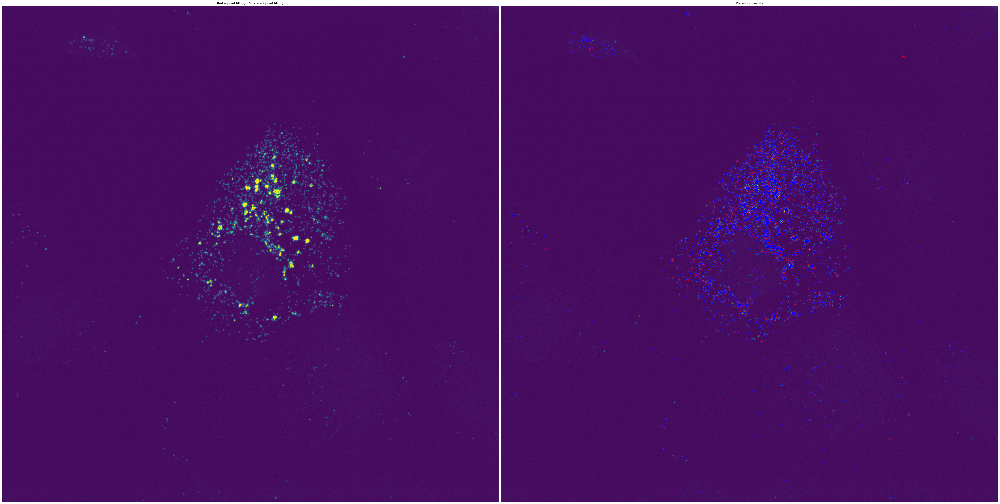

Plotting done  81.81830406188965 sec


In [12]:
start_time = time.time()

## Pixel-fitted spots
print("Decomposed spots (pixel fitted)")
print("\r shape: {0}".format(spots_post_decomposition.shape))
print("\r dtype: {0}".format(spots_post_decomposition.dtype), "\n")
print(spots_post_decomposition)

## Subpixel fitting
spots_post_decomposition_subpixel = detection.fit_subpixel(
    image = rna,
    spots = spots_post_decomposition,
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx),
    spot_radius = (psf_z, psf_yx, psf_yx)
)
print(" ")
print("Subpixel fitting done ", time.time() - start_time, "sec","\n")
print("spots (subpixel fitted)")
print("\r shape: {0}".format(spots_post_decomposition_subpixel.shape))
print("\r dtype: {0}".format(spots_post_decomposition_subpixel.dtype), "\n")
print(spots_post_decomposition_subpixel)

## Plot
plot.plot_detection(
    rna_mip, 
    spots=[spots_post_decomposition, spots_post_decomposition_subpixel], 
    radius=3, 
    color=["red", "blue"],
    title="Red = pixel fitting | Blue = subpixel fitting",
    linewidth = 1, contrast = True, framesize = (50, 40))

print ("Plotting done ", time.time() - start_time, "sec")

## 2-4. Cluster decomposed spots

Two spots are considered connected if they localized within a specific radius (in nanometer). Above a minimum number of connected spots, a cluster can be defined. This detection can be computed with `bigfish.detection.detect_clusters`.

clustering done  0.04377293586730957 sec 

detected spots after clustering
 shape: (3982, 4)
 dtype: float64 

detected clusters
 shape: (48, 5)
 dtype: float64 

[[ 2.00000000e+00  0.00000000e+00  0.00000000e+00 -1.00000000e+00]
 [ 2.01673636e+00  1.25834610e+03  7.10658009e+02 -1.00000000e+00]
 [ 4.41564507e+00  7.58775297e+02  9.65038829e+02 -1.00000000e+00]
 ...
 [ 2.76525978e+01  1.02457967e+03  1.05103752e+03 -1.00000000e+00]
 [ 2.75998226e+01  1.02458314e+03  1.05111572e+03 -1.00000000e+00]
 [ 2.75698572e+01  1.02444530e+03  1.05115569e+03 -1.00000000e+00]]


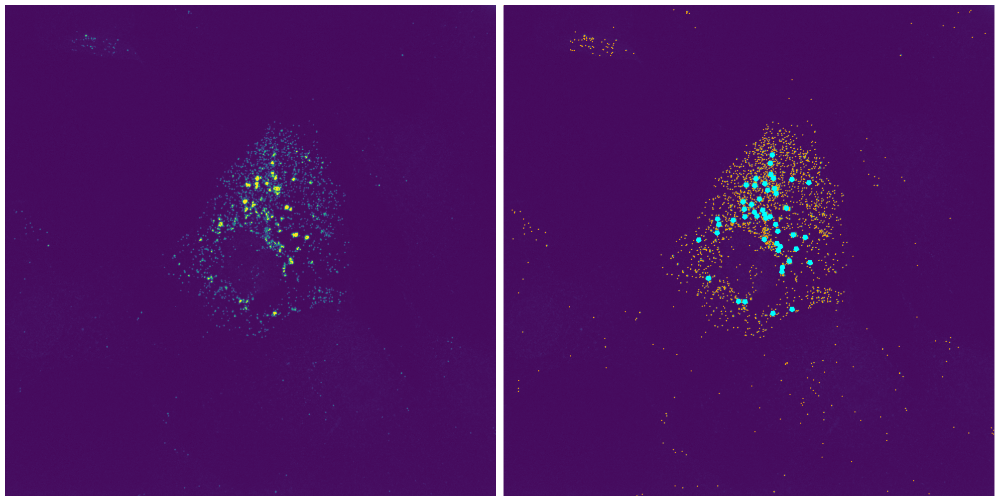

Plotting done  10.304345846176147 sec


In [13]:
start_time = time.time() 

# cluster decomposed spots aggregating within a defiend radius with a minumum spot number cutoff
radius = 600
nb_min_spots = 12

spots_post_clustering, clusters = detection.detect_clusters(
    spots = spots_post_decomposition_subpixel, 
    voxel_size = (voxel_size_z, voxel_size_yx, voxel_size_yx), 
    radius = radius, 
    nb_min_spots = nb_min_spots
)

print ("clustering done ", time.time() - start_time, "sec", "\n")

print("detected spots after clustering")
print("\r shape: {0}".format(spots_post_clustering.shape))
print("\r dtype: {0}".format(spots_post_clustering.dtype), "\n")
print("detected clusters")
print("\r shape: {0}".format(clusters.shape))
print("\r dtype: {0}".format(clusters.dtype), "\n")
print(spots_post_clustering)

# plot
plot.plot_detection(rna_mip, 
                    spots = [spots_post_decomposition_subpixel, clusters[:, :3]], 
                    shape = ["circle", "polygon"], 
                    radius = [spot_radius_px[-1], radius/voxel_size_yx], 
                    color = ["orange", "cyan"],
                    linewidth = [1, 2], 
                    fill = [False, True], 
                    framesize = (20, 16),
                    contrast = True)

print ("Plotting done ", time.time() - start_time, "sec")


In [15]:
# 4 columns: z, y, x, is_in_cluster? -1 no 1 yes
print(spots_post_clustering)

[[ 2.00000000e+00  0.00000000e+00  0.00000000e+00 -1.00000000e+00]
 [ 2.01673636e+00  1.25834610e+03  7.10658009e+02 -1.00000000e+00]
 [ 4.41564507e+00  7.58775297e+02  9.65038829e+02 -1.00000000e+00]
 ...
 [ 2.76525978e+01  1.02457967e+03  1.05103752e+03 -1.00000000e+00]
 [ 2.75998226e+01  1.02458314e+03  1.05111572e+03 -1.00000000e+00]
 [ 2.75698572e+01  1.02444530e+03  1.05115569e+03 -1.00000000e+00]]


In [19]:
# 5 columns (3D image): z, y, x (cluster centroid coordinates), number of spots in cluster, cluster index 
print(clusters)

[[7.71890223e+00 7.25204516e+02 1.05426312e+03 4.20000000e+01
  0.00000000e+00]
 [7.25385875e+00 9.79942378e+02 8.15271543e+02 1.70000000e+01
  1.00000000e+00]
 [7.48117849e+00 6.60244051e+02 1.11424669e+03 3.20000000e+01
  2.00000000e+00]
 [6.72320795e+00 7.41453926e+02 1.27485822e+03 1.40000000e+01
  3.00000000e+00]
 [9.37720876e+00 7.53432341e+02 1.04900286e+03 6.20000000e+01
  4.00000000e+00]
 [8.00066619e+00 8.92582134e+02 8.93885117e+02 1.80000000e+01
  5.00000000e+00]
 [1.01101877e+01 7.23261611e+02 1.12776068e+03 2.80000000e+01
  6.00000000e+00]
 [8.80631194e+00 9.69194678e+02 1.25989702e+03 3.60000000e+01
  7.00000000e+00]
 [1.01950480e+01 7.07016137e+02 1.11630245e+03 3.00000000e+01
  8.00000000e+00]
 [1.05210656e+01 7.72763848e+02 1.10310069e+03 2.20000000e+01
  9.00000000e+00]
 [9.85659480e+00 8.51988248e+02 1.00551691e+03 3.40000000e+01
  1.00000000e+01]
 [9.43273220e+00 7.27910569e+02 1.20411771e+03 2.40000000e+01
  1.10000000e+01]
 [9.17969402e+00 7.45492802e+02 1.091112

## 3 Assign spots to cells

### 3-1 Extract cell-level results

In [20]:
image_contrasted = stack.rescale(np.array(rna_no_bg), channel_to_stretch = 0)
image_contrasted = stack.maximum_projection(image_contrasted)

fov_results = multistack.extract_cell(
    cell_label = masks, 
    ndim = 3, 
    rna_coord = spots_post_clustering, 
    others_coord = {"clusters": clusters},
    image = image_contrasted,
)

print("number of cells identified from segmentation: {0}".format(len(fov_results)))

number of cells identified from segmentation: 4


cell 0
 number of rna 0
 number of cluster 0


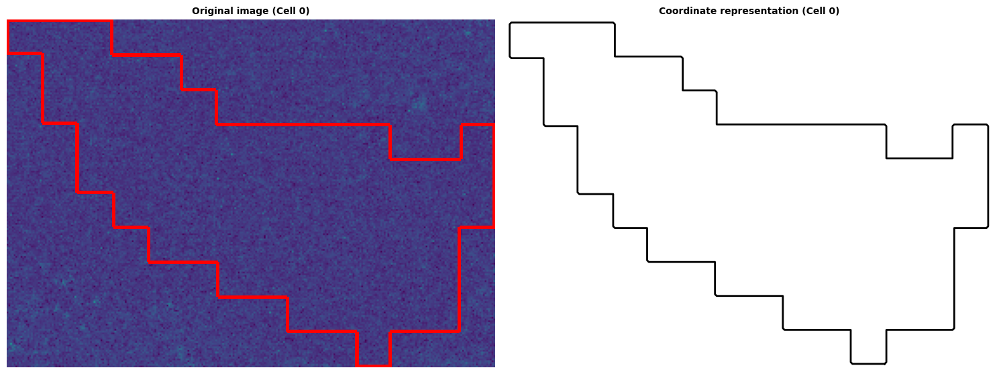

cell 1
 number of rna 3655
 number of cluster 47


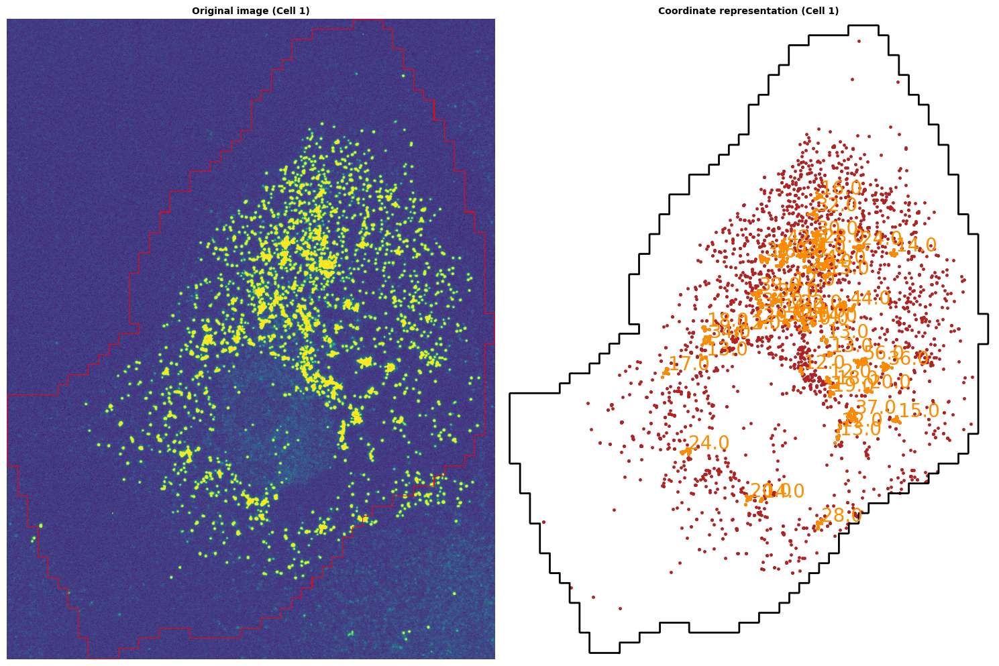

cell 2
 number of rna 0
 number of cluster 0


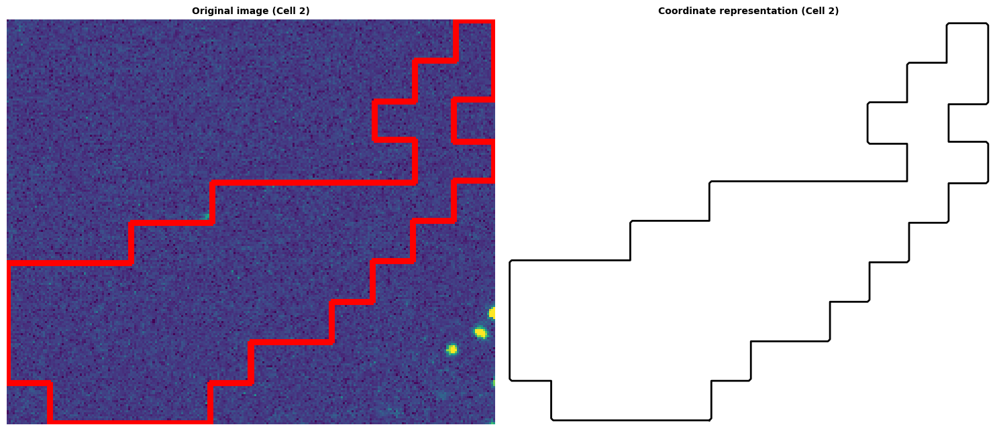

cell 3
 number of rna 2
 number of cluster 0


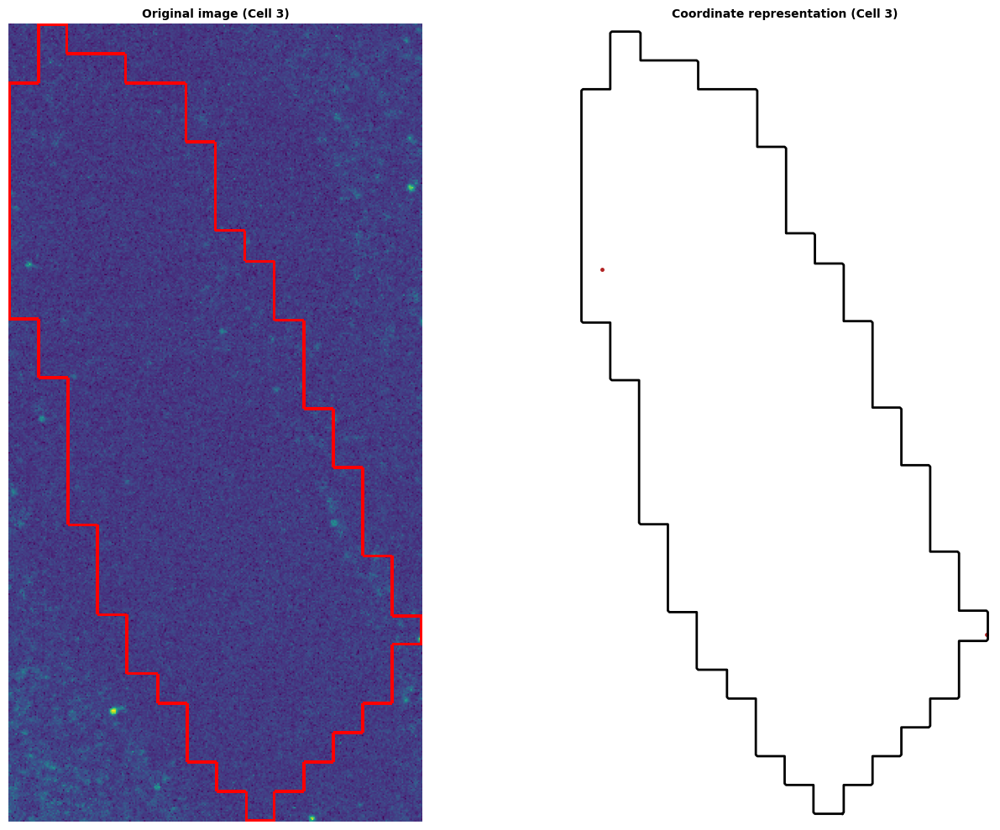

In [21]:
for i, cell_results in enumerate(fov_results):
    print("cell {0}".format(i))
    
    # get cell results
    cell_mask = cell_results["cell_mask"]
    cell_coord = cell_results["cell_coord"]
    rna_coord = cell_results["rna_coord"]
    cluster_coord = cell_results["clusters"]
    image_contrasted = cell_results["image"]
    print("\r number of rna {0}".format(len(rna_coord)))
    print("\r number of cluster {0}".format(len(cluster_coord)))
    
    # plot cell
    plot.plot_cell(
        ndim=3, cell_coord=cell_coord,
        rna_coord=rna_coord, foci_coord=cluster_coord,
        image=image_contrasted, cell_mask=cell_mask,
        title="Cell {0}".format(i))

In [23]:
# summarise
df = multistack.summarize_extraction_results(fov_results, ndim = 3)
df["file_name"] = os.path.basename(file_name)
df.head()

,cell_id,cell_area,nuc_area,nb_rna,nb_rna_in_nuc,nb_rna_out_nuc,nb_clusters,file_name
0,5,26900,NaN,0,NaN,NaN,0,FISH-01_4h_17_bsub50.tif
1,6,729611,NaN,3655,NaN,NaN,47,FISH-01_4h_17_bsub50.tif
2,8,18860,NaN,0,NaN,NaN,0,FISH-01_4h_17_bsub50.tif
3,9,79962,NaN,2,NaN,NaN,0,FISH-01_4h_17_bsub50.tif


### 3-2 Optional: Output dataframe

In [24]:
df.to_csv("output.csv")